In this Notebook, I perform Explonatory Data Analysis and Data Transformation on the Skin Cancer Dataset

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns

In [2]:
base_skin_dir = "C:\Users\PC\Jupyter Notebooks\MAJOR PROJECT - Skin Lesions\archive"
skin_df = pd.read_csv(os.path.join(base_skin_dir, 'HAM10000_metadata.csv')) # load in the data
skin_df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


In [3]:
imageid_path_dict = {os.path.splitext(os.path.basename(x))[0]: x
                     for x in glob(os.path.join(base_skin_dir, '*', '*.jpg'))}

lesion_type_dict = {
    'nv': 'Melanocytic_nevi',
    'mel': 'melanoma',
    'bkl': 'Benign_keratosis-like_lesions',
    'bcc': 'Basal_cell_carcinoma',
    'akiec': 'Actinic_keratoses',
    'vasc': 'Vascular_lesions',
    'df': 'Dermatofibroma'
}

lesion_danger = {
    'nv': 0, # 0 for benign
    'mel': 1, # 1 for malignant
    'bkl': 0, # 0 for benign
    'bcc': 1, # 1 for malignant
    'akiec': 1, # 1 for malignant
    'vasc': 0,
    'df': 0
}

In [4]:
skin_df["path"] = skin_df["image_id"].map(imageid_path_dict.get) # map image_id to the path of that image

In [5]:
skin_df["path"] = skin_df["image_id"].map(imageid_path_dict.get) # map image_id to the path of that image

In [6]:
skin_df["cell_type"] = skin_df["dx"].map(lesion_type_dict.get) # map dx to type of lesion

In [8]:
skin_df["Malignant"] = skin_df["dx"].map(lesion_danger.get)

In [10]:
skin_df["cell_type_idx"] = pd.Categorical(skin_df["cell_type"]).codes # give each cell type a category id

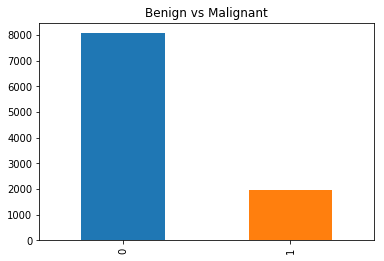

In [12]:
skin_df["Malignant"].value_counts().plot(kind="bar", title="Benign vs Malignant")

Most cases in our dataset are benign.

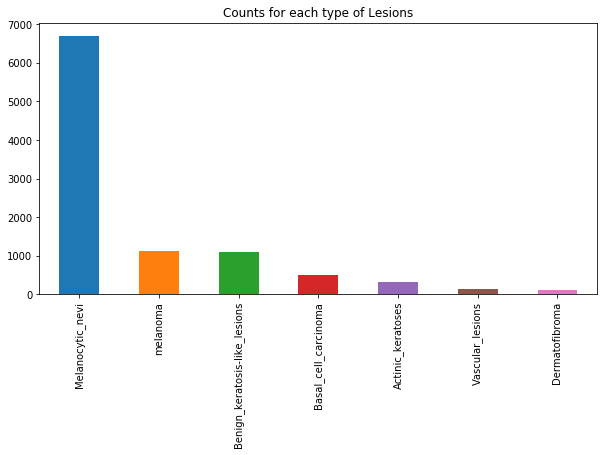

In [13]:
fig, ax1 = plt.subplots(1,1,figsize=(10,5))
skin_df["cell_type"].value_counts().plot(kind="bar", ax=ax1, title="Counts for each type of Lesions") # plot a graph counting the number of each cell type

Our dataset is biased toward Melanocytic nevi. The cell_type with the second highest samples is the noctorious melanoma

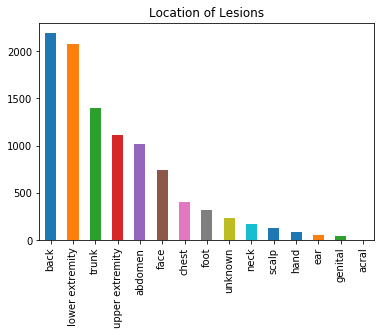

In [14]:
# let's see where lesions are mostly located
skin_df["localization"].value_counts().plot(kind='bar', title="Location of Lesions")

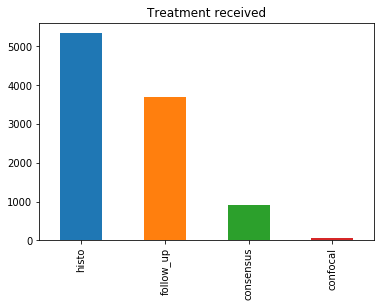

In [15]:
skin_df["dx_type"].value_counts().plot(kind='bar', title="Treatment received")

Description for each dx_type:

histo: "Histopathologic diagnoses of excised lesions have been performed by specialized dermatopathologists."

follow_up: "If nevi monitored by digital dermatoscopy did not show any changes during 3 follow-up visits or 1.5 years we accepted this as evidence of biologic benignity. Only nevi, but no other benign diagnoses were labeled with this type of ground-truth because dermatologists usually do not monitor dermatofibromas, seborrheic keratoses, or vascular lesions."

consensus: "For typical benign cases without histopathology or follow-up we provide an expertconsensus rating of authors PT and HK. We applied the consensus label only if both authors independently gave the same unequivocal benign diagnosis. Lesions with this type of ground-truth were usually photographed for educational reasons and did not need further follow-up or biopsy for
confirmation."

confocal: "Reflectance confocal microscopy is an in-vivo imaging technique with a resolution at near-cellular level, and some facial benign keratoses were verified by this method."

Let's look at some characteristics of our patients

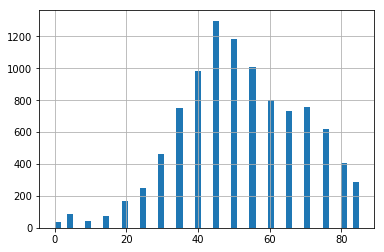

In [16]:
skin_df["age"].hist(bins=50)

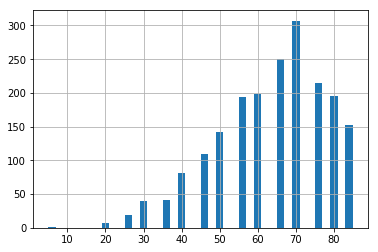

In [17]:
skin_df[skin_df["Malignant"] == 1]["age"].hist(bins=40)

We can see that most of patients are above 30. But for the malignant cases, most patients are 50 and above,  and 70s - year - old patients are the most present.

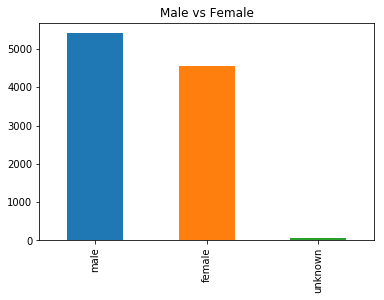

In [18]:
skin_df["sex"].value_counts().plot(kind="bar", title="Male vs Female")

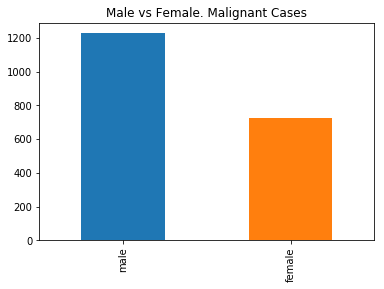

In [19]:
skin_df[skin_df["Malignant"] == 1]["sex"].value_counts().plot(kind="bar", title="Male vs Female. Malignant Cases")

We have more male patients than female patients in both general population and in malignant case. So far we haven't looked at our image yet. So let's now change our focus into how lesions in our dataset look like.

In [20]:
from skimage.io import imread

In [21]:
skin_df["image"] = skin_df["path"].map(imread) # read the image to array values

In [22]:
skin_df.iloc[0]["image"] # here is a sample

array([[[188, 147, 191],
        [186, 148, 189],
        [187, 150, 191],
        ...,
        [196, 155, 171],
        [197, 156, 170],
        [197, 157, 168]],

       [[186, 149, 193],
        [187, 152, 194],
        [189, 153, 191],
        ...,
        [194, 156, 169],
        [195, 159, 169],
        [192, 159, 168]],

       [[185, 148, 192],
        [189, 152, 195],
        [190, 153, 196],
        ...,
        [196, 155, 169],
        [198, 157, 171],
        [194, 156, 169]],

       ...,

       [[157, 124, 155],
        [156, 121, 154],
        [159, 124, 154],
        ...,
        [177, 146, 161],
        [176, 144, 159],
        [175, 141, 155]],

       [[155, 122, 151],
        [156, 123, 154],
        [156, 123, 152],
        ...,
        [178, 147, 163],
        [175, 144, 159],
        [175, 142, 159]],

       [[154, 119, 151],
        [153, 120, 149],
        [154, 121, 152],
        ...,
        [176, 147, 167],
        [175, 147, 161],
        [173, 143, 155]]

In [23]:
# let's see what is the shape of each value in the image column
skin_df["image"].map(lambda x: x.shape).value_counts() 

(450, 600, 3)    10015
Name: image, dtype: int64

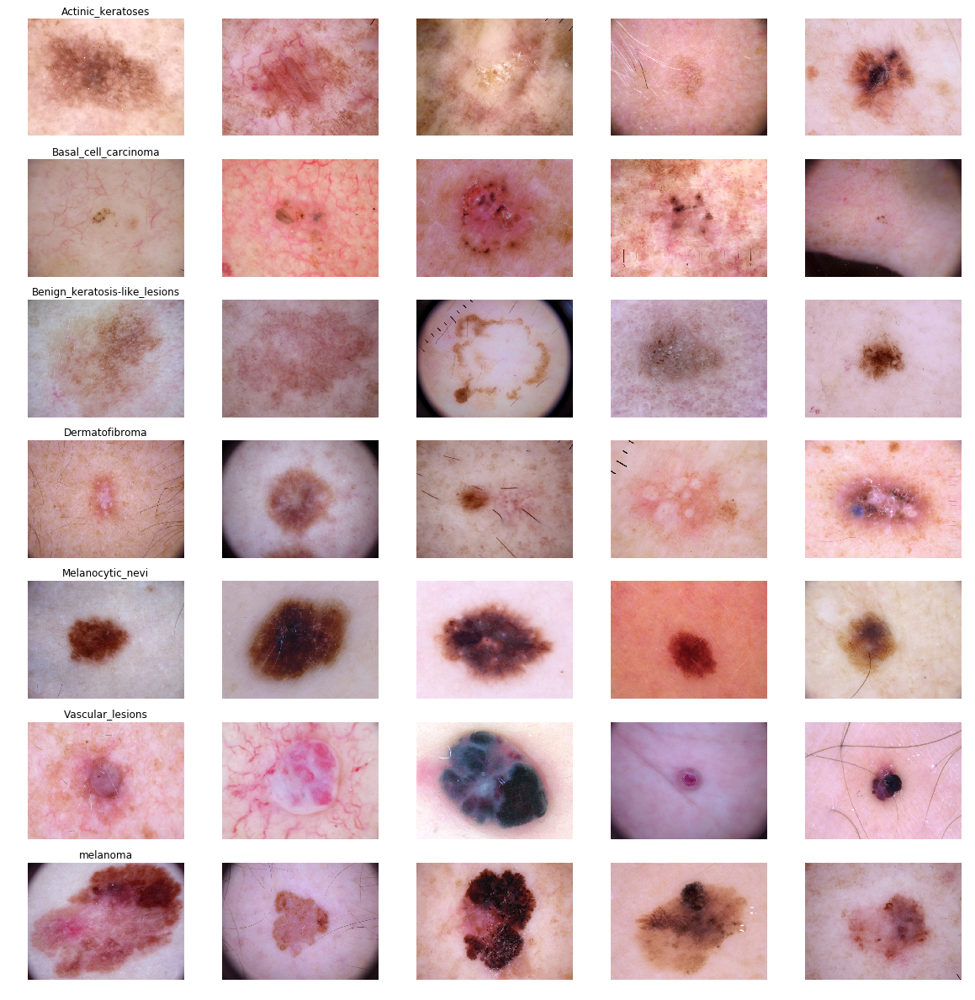

In [24]:
# let's have a look at the image data

n_samples = 5 # choose 5 samples for each cell type
fig, m_axs = plt.subplots(7, n_samples, figsize=(4*n_samples, 3 * 7))

for n_axs, (type_name, type_rows) in zip(m_axs, skin_df.sort_values(["cell_type"]).groupby("cell_type")):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=0).iterrows()):
        c_ax.imshow(c_row["image"])
        c_ax.axis("off")
fig.savefig("category_samples.png", dpi=300)

Based on these images, it is still very hard for non-experts to know which is which.

## Get Average Color Information

Here we get and normalize all of the color channel information

The shape of the image array is (450, 600, 3). 3 are the 3 chanels: Red, Blue and Green! Taking the mean across axis=(0,1) gives the mean for each 3 channels.

In [25]:
# create a pandas dataframe to store mean value of Red, Blue and Green for each picture
rgb_info_df = skin_df.apply(lambda x: pd.Series({'{}_mean'.format(k): v for k, v 
                                                 in zip(["Red", "Blue", "Green"], 
                                                        np.mean(x["image"], (0, 1)))}), 1)


gray_col_vec = rgb_info_df.apply(lambda x: np.mean(x), 1) # take the mean value across columns of rgb_info_df
for c_col in rgb_info_df.columns:
    rgb_info_df[c_col] = rgb_info_df[c_col]/gray_col_vec 
rgb_info_df["Gray_mean"] = gray_col_vec
rgb_info_df.sample(3)

,Blue_mean,Green_mean,Red_mean,Gray_mean
5246,0.826203,0.832444,1.341353,172.596749
3307,0.824750,0.780592,1.394658,159.067422
6380,0.826211,0.807337,1.366452,166.591609


In [26]:
for c_col in rgb_info_df.columns:
    skin_df[c_col] = rgb_info_df[c_col].values

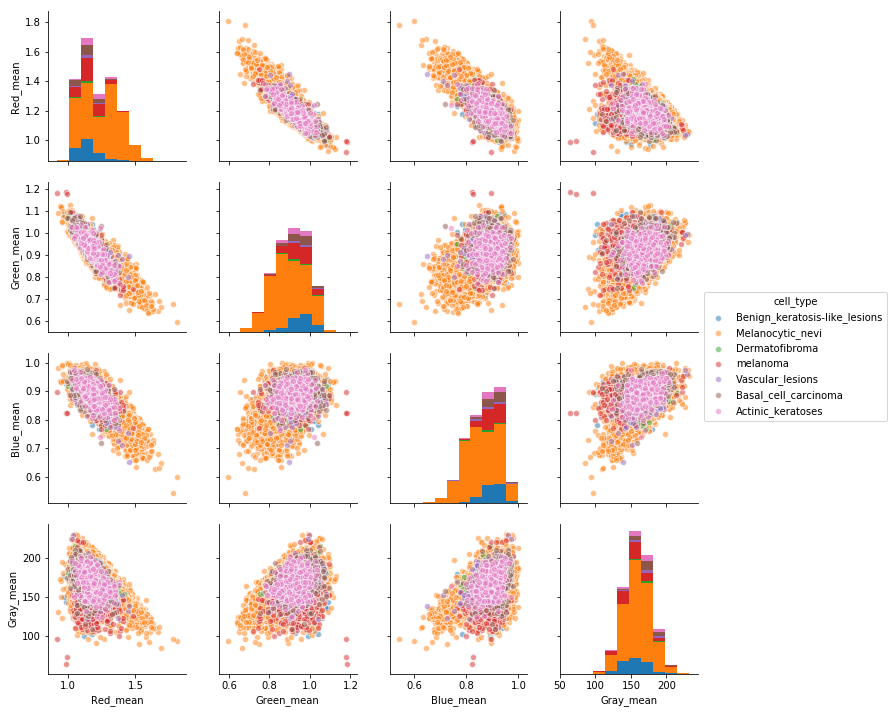

In [27]:
# let's draw a plot showing the distribution of different cell types over colors!
sns.pairplot(skin_df[["Red_mean", "Green_mean", "Blue_mean", "Gray_mean", "cell_type"]], 
             hue="cell_type", plot_kws = {"alpha": 0.5})

## Changes in cell type appearance as values in color chanel changes

In this section, I am doing an analysis on how each cell type looks like when each color channel values changes. E.g. the first 5 images demonstrate how cell Actinic Keratoses appearance changes as the values in red channel gets bigger. 

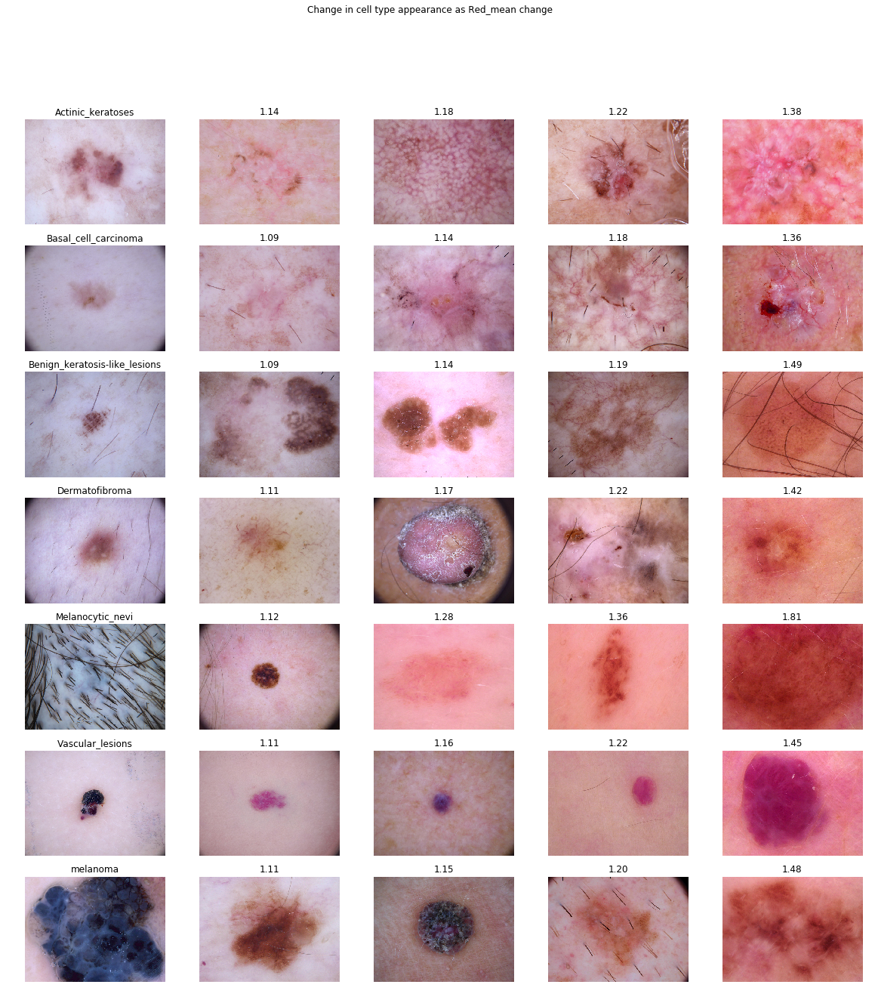

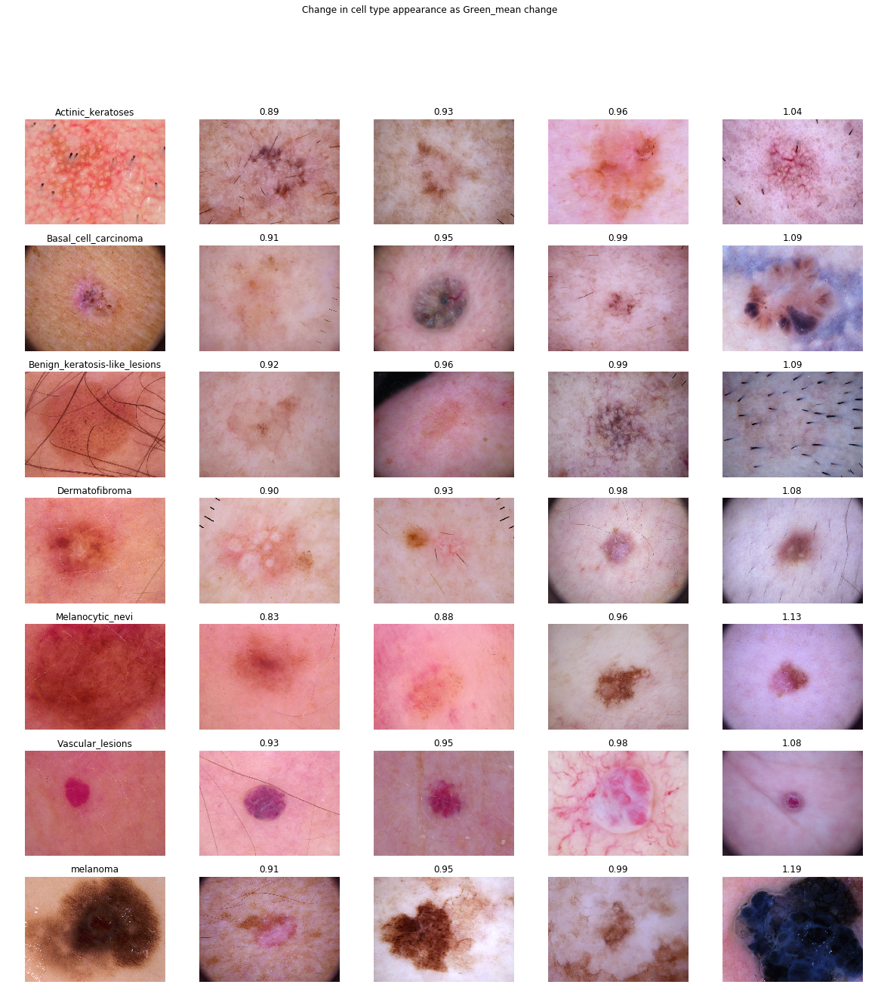

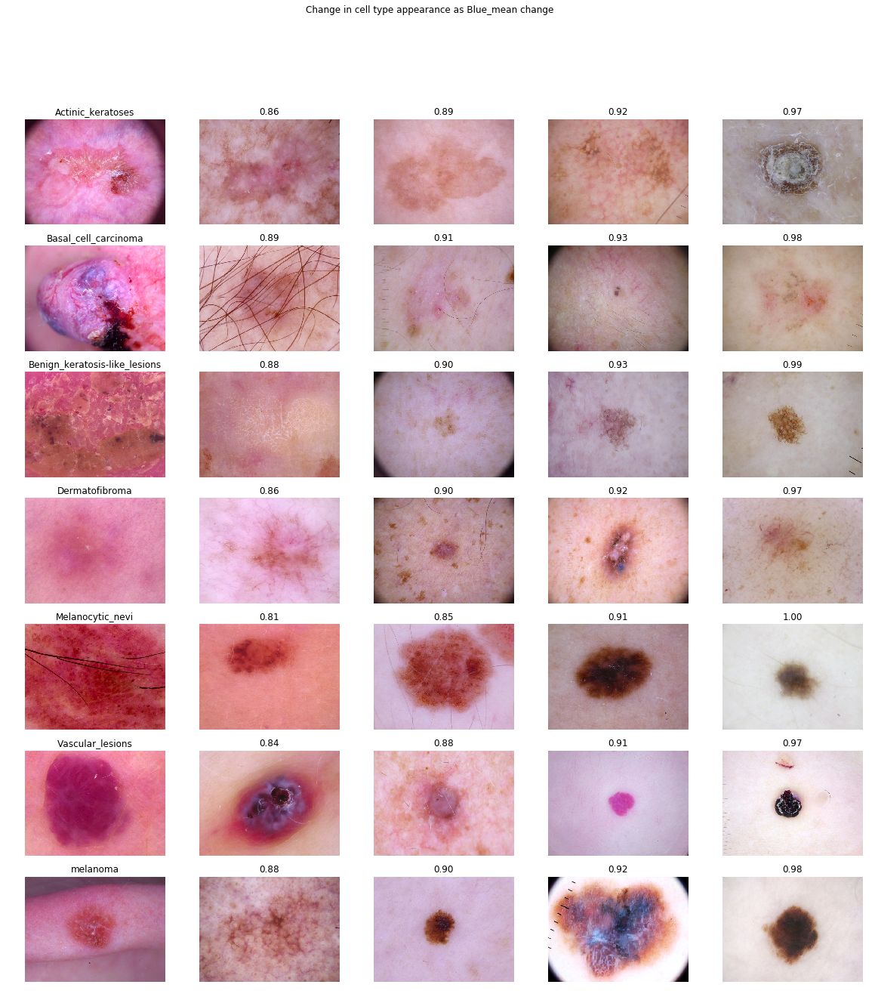

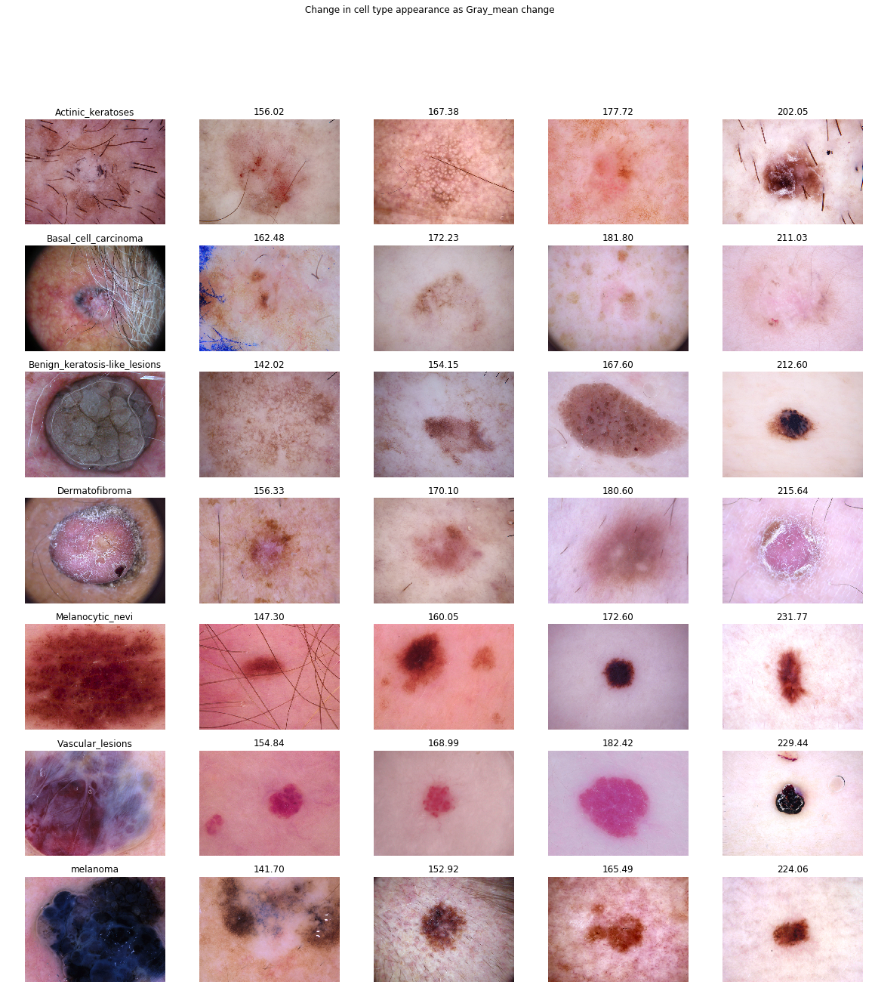

In [28]:
n_samples = 5
for sample_col in ["Red_mean", "Green_mean", "Blue_mean", "Gray_mean"]:
    fig, m_axs = plt.subplots(7, n_samples, figsize=(4 * n_samples, 3 * 7))
    fig.suptitle(f"Change in cell type appearance as {sample_col} change")
    # define a function to get back a dataframe with 5 samples sorted by color channel values 
    def take_n_space(in_rows, val_col, n):
        s_rows = in_rows.sort_values([val_col])
        s_idx = np.linspace(0, s_rows.shape[0] - 1, n, dtype=int)
        return s_rows.iloc[s_idx]
    
    for n_axs, (type_name, type_rows) in zip(m_axs, skin_df.sort_values(["cell_type"]).groupby("cell_type")):
        for c_ax, (_, c_row) in zip(n_axs, take_n_space(type_rows, sample_col, n_samples).iterrows()):
            c_ax.imshow(c_row["image"])
            c_ax.axis("off")
            c_ax.set_title('{:2.2f}'.format(c_row[sample_col]))
        n_axs[0].set_title(type_name)
    fig.savefig("{}_samples.png".format(sample_col), dpi=300)

### Reshape image and get data for classification

In [29]:
from PIL import Image

### Resize image for baseline model

In [30]:
reshaped_image = skin_df["path"].map(lambda x: np.asarray(Image.open(x).resize((64,64), resample=Image.LANCZOS).\
                                                          convert("RGB")).ravel())

In [31]:
out_vec = np.stack(reshaped_image, 0)

In [32]:
out_df = pd.DataFrame(out_vec)

In [33]:
out_df["label"] = skin_df["cell_type_idx"]

In [34]:
out_df.head()

,0,1,2,3,4,5,6,7,8,9,...,12279,12280,12281,12282,12283,12284,12285,12286,12287,label
0,191,152,194,191,153,195,192,149,192,194,...,185,154,180,186,156,184,182,152,173,2
1,24,13,23,24,14,28,37,24,46,61,...,26,15,29,27,15,28,24,13,25,2
2,185,129,140,192,136,151,198,142,156,198,...,152,120,138,144,113,123,115,81,84,2
3,24,11,19,36,19,30,64,38,50,91,...,27,13,16,25,12,16,24,9,14,2
4,138,94,117,158,113,138,178,133,161,191,...,140,106,118,108,77,92,67,40,55,2


In [35]:
out_path = "hmnist_64_64_RBG.csv"
out_df.to_csv(out_path, index=False)

### Resize Image for Retraining Model

In [30]:
img = Image.open(skin_df["path"][0])
img.size

(600, 450)

In [31]:
!mkdir skin_lesion_types

mkdir: skin_lesion_types: File exists


In [32]:
skin_df["cell_type"].unique()

array(['Benign_keratosis-like_lesions', 'Melanocytic_nevi',
       'Dermatofibroma', 'melanoma', 'Vascular_lesions',
       'Basal_cell_carcinoma', 'Actinic_keratoses'], dtype=object)

In [33]:
skin_df["path"][0]

'/Users/Hoang/Machine_Learning/skin_cancer/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0027419.jpg'

In [34]:
for index in skin_df.index.values.tolist():
    path = skin_df.iloc[index]["path"]
    cell_type_idx = skin_df.iloc[index]["cell_type"]
    img_id = skin_df.iloc[index]["image_id"]
    newpath = f"C:/Users/PC/Jupyter Notebooks/MAJOR PROJECT - Skin Lesions/archive/skin_cancer/skin_lesion_types/{cell_type_idx}/{img_id}.jpg"
    img = Image.open(path)
    img = img.resize((299, 299), resample=Image.LANCZOS)
    img.save(newpath)

### Resize Image for Keras Fine-Tuning Model

In [30]:
reshaped_image = skin_df["path"].map(lambda x: np.asarray(Image.open(x).resize((256,192), resample=Image.LANCZOS).\
                                                          convert("RGB")))

In [31]:
out_vec = np.stack(reshaped_image, 0)

In [32]:
out_vec.shape

(10015, 192, 256, 3)

In [34]:
out_vec = out_vec.astype("float32")
out_vec /= 255

In [35]:
labels = skin_df["cell_type_idx"].values

In [36]:
from sklearn.model_selection import train_test_split

In [38]:
X_train_orig, X_test, y_train_orig, y_test = train_test_split(out_vec, labels, test_size=0.1,random_state=0)

In [39]:
np.save("256_192_test.npy", X_test)
np.save("test_labels.npy", y_test)

In [40]:
X_train, X_val, y_train, y_val = train_test_split(X_train_orig, y_train_orig, test_size=0.1, random_state=1)

In [41]:
np.save("256_192_val.npy", X_val)
np.save("val_labels.npy", y_val)

In [42]:
np.save("256_192_train.npy", X_train)
np.save("train_labels.npy", y_train)